In [1]:
import sys
import scanpy as sc
import squidpy as sq
import anndata
import pandas as pd
import numpy as np
import os

data_type = 'float32'

import cell2location as c2l

import matplotlib as mpl
from matplotlib import rcParams
import matplotlib.pyplot as plt
import seaborn as sns

sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=80, facecolor="white")

# silence scanpy that prints a lot of warnings
import warnings
warnings.filterwarnings('ignore')

/opt/mambaforge/envs/cell2loc_env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/opt/mambaforge/envs/cell2loc_env/lib/python3.9/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/opt/mambaforge/envs/cell2loc_env/lib/python3.9/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (


In [2]:
adata_st = anndata.read_h5ad(
            filename="/mnt/rdisk/duydao/PROJECT/SPATIAL/cell2loc_data/adata_st_A1_cell2loc.h5ad"
        )

In [3]:
adata_st

AnnData object with n_obs × n_vars = 4961 × 15619
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', '_indices', '_scvi_batch', '_scvi_labels', 'Alveolar', 'Alveolar Mac', 'CAF', 'CD4+ Treg', 'CD8+ Tem', 'CDKN2A Cancer', 'CXCL1 Cancer', 'Ciliated', 'Endothelial', 'LAMC2 Cancer', 'Lipid-associated Mac', 'Low quality Mac', 'Mast', 'Mature naive B', 'Monocytes', 'NK', 'Naive T', 'Neutrophils', 'Pathological Alveolar', 'Plasma', 'Proliferating Cancer', 'Proliferating Mac', 'Proliferating T/NK', 'SMC', 'SOX2 Cancer', 'cDC2/moDCs', 'pDCs'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'feature_name', 'MT_gene'
    uns: '_scvi_manager_uuid', '_scvi_u

# select one slide for visualization
#slide = c2l.utils.select_slide(adata_st, "Visium_FFPE_A1", batch_key="patient_region_id")

with mpl.rc_context({"figure.figsize": [4.5, 5]}):
    sc.pl.spatial(adata_st,
        #slide,
        cmap="magma",
        color=adata_st.uns["mod"]["factor_names"],
        ncols=4,
        size=1.3,
        img_key="hires",
        # limit color scale at 99.2% quantile of cell abundance
        vmin=0,
        vmax="p99.2",
    )

## Identifying discrete tissue regions by Leiden clustering

The number of KNN neighbours should be adapted to size of dataset and the size of anatomically defined regions

In [4]:
# compute KNN using the cell2location output stored in adata.obsm
sc.pp.neighbors(adata_st, use_rep='q05_cell_abundance_w_sf',
                n_neighbors = 15)

# Cluster spots into regions using scanpy
sc.tl.leiden(adata_st, resolution=1.1)

# add region as categorical variable
adata_st.obs["region_cluster"] = adata_st.obs["leiden"].astype("category")

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


We can use the location composition similarity graph to build a joint integrated UMAP representation of all section/Visium batches.

In [5]:
adata_st.obs["sample"] = "Visium_FFPE_A1"

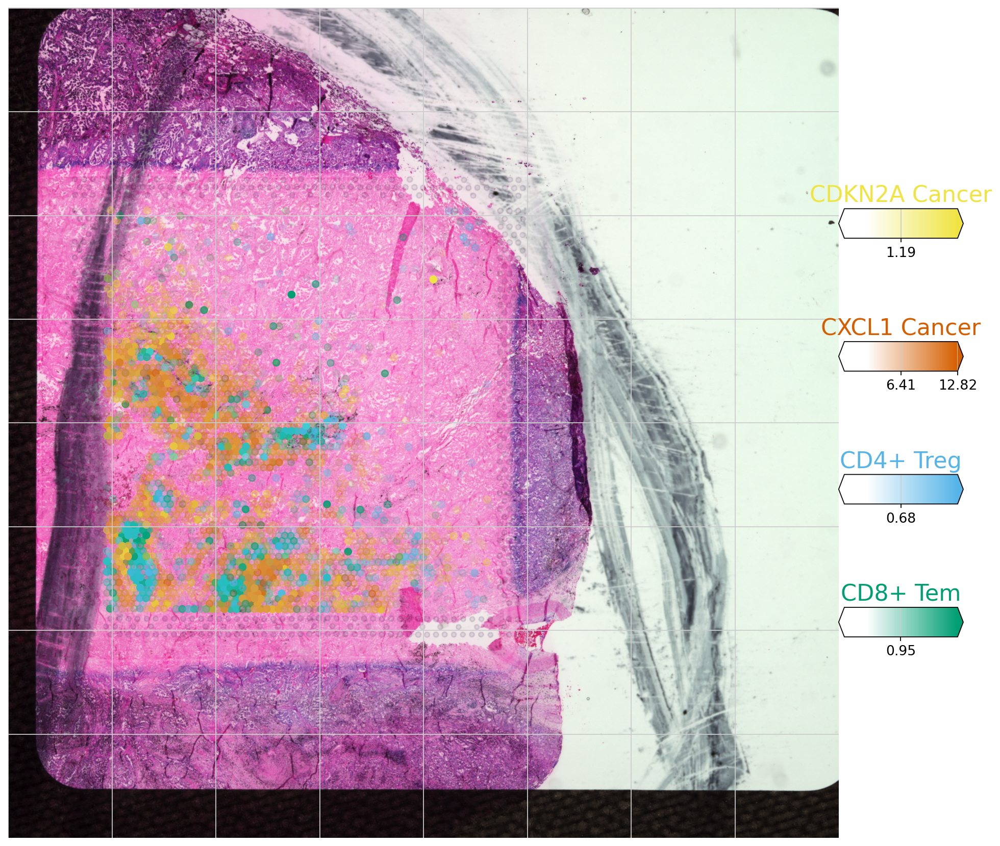

In [6]:
# Now we use cell2location plotter that allows showing multiple cell types in one panel
from cell2location.plt import plot_spatial

# select up to 6 clusters
clust_labels = ['CDKN2A Cancer', 'CXCL1 Cancer', 'CD4+ Treg', 'CD8+ Tem']
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels

#slide = select_slide(adata_vis, 'V1_Human_Lymph_Node')

with mpl.rc_context({'figure.figsize': (15, 15)}):
    fig = plot_spatial(
        adata=adata_st,
        # labels to show on a plot
        color=clust_col, labels=clust_labels,
        show_img=True,
        # 'fast' (white background) or 'dark_background'
        style='fast',
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=0.992,
        # size of locations (adjust depending on figure size)
        circle_diameter=6,
        colorbar_position='right'
    )

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)


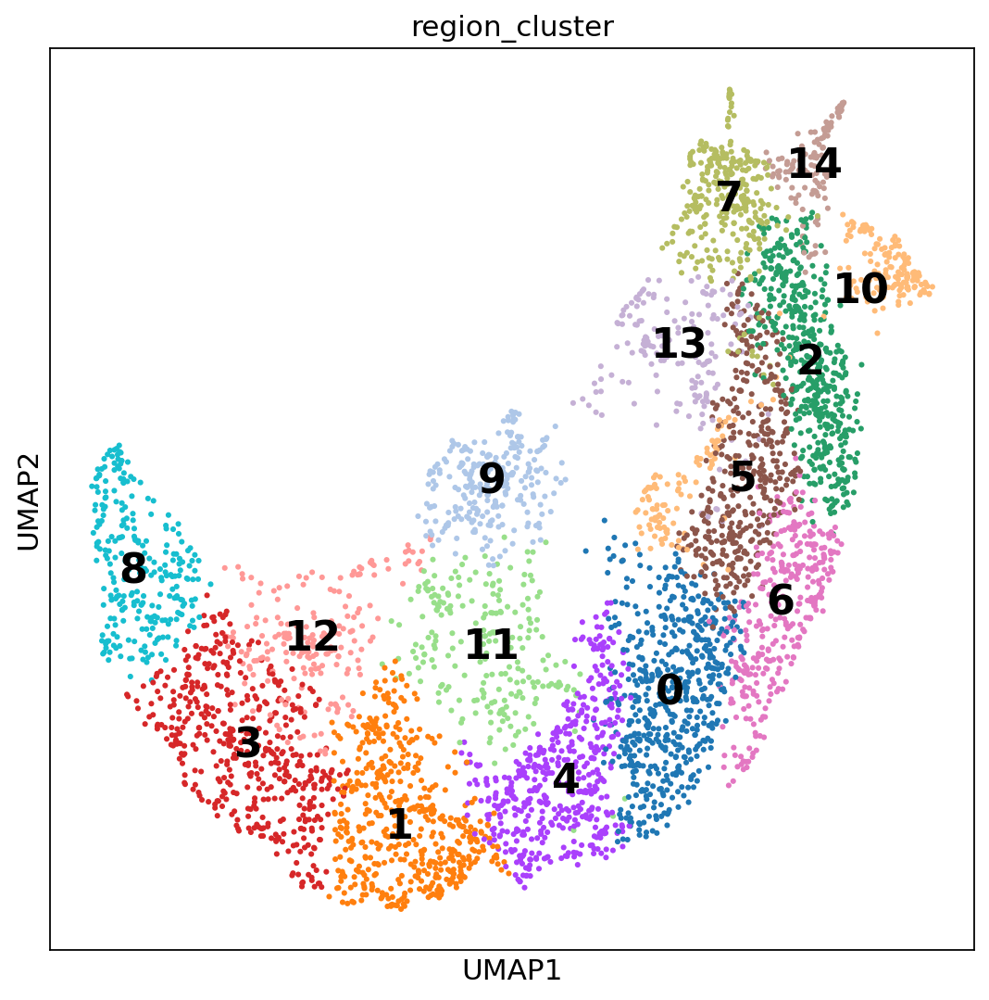

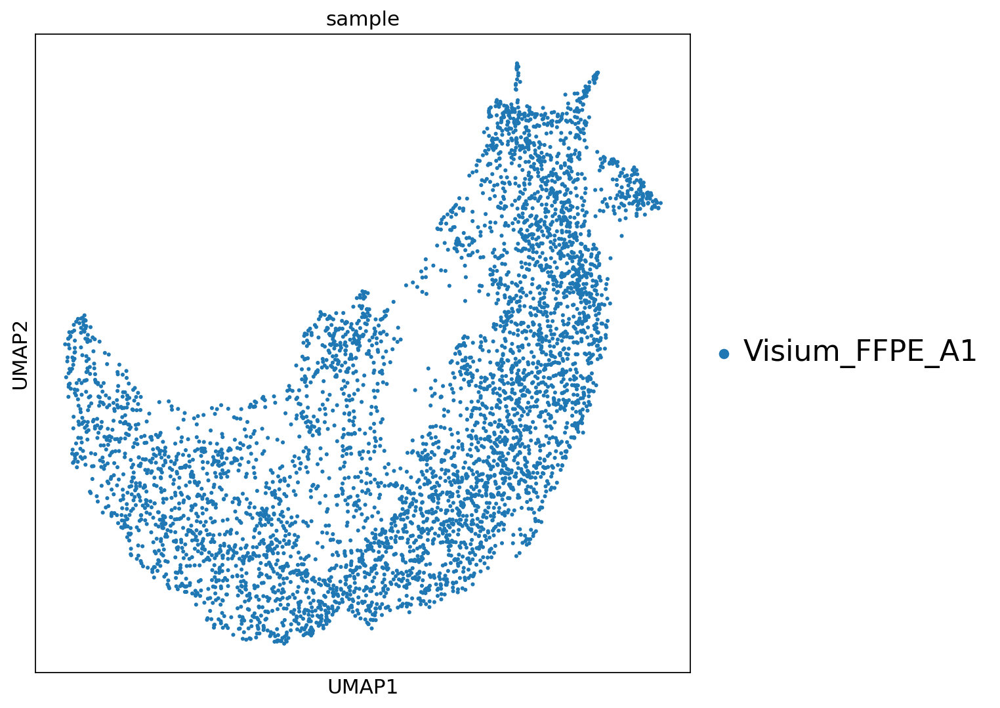

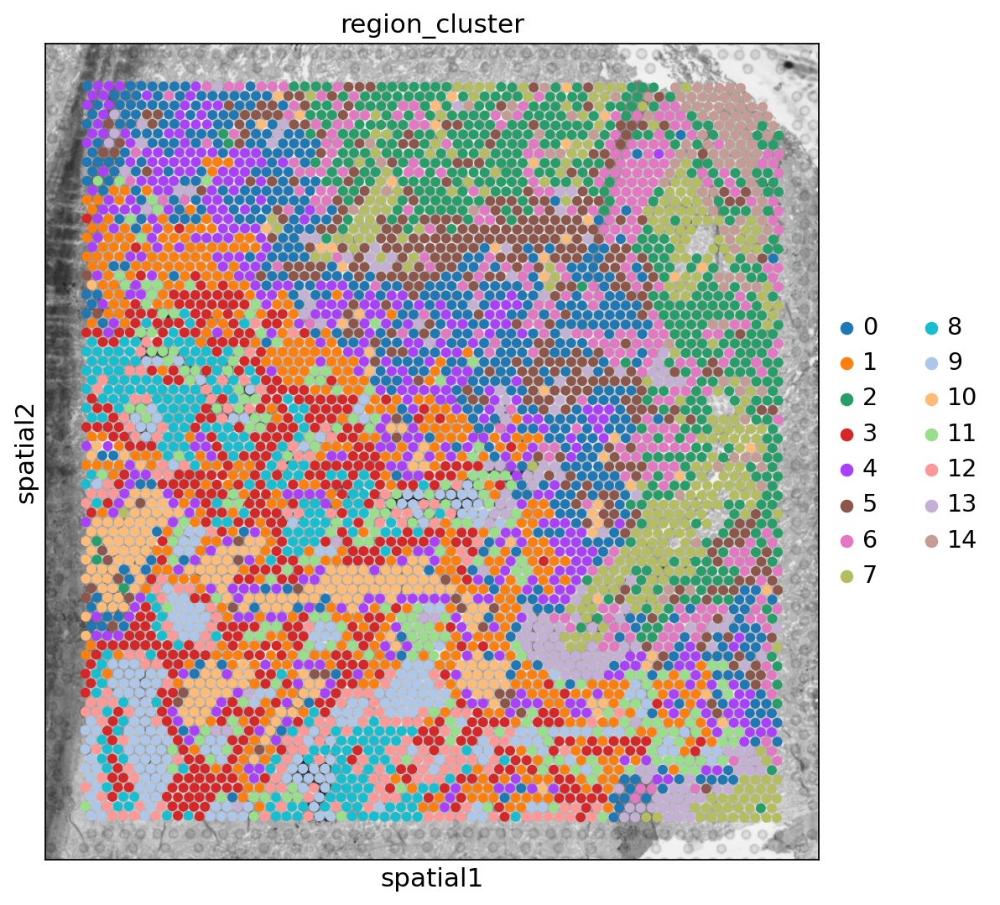

In [7]:
# compute UMAP using KNN graph based on the cell2location output
sc.tl.umap(adata_st, min_dist = 0.3, spread = 1)

# show regions in UMAP coordinates
with mpl.rc_context({'axes.facecolor':  'white',
                     'figure.figsize': [8, 8]}):
    sc.pl.umap(adata_st, color=['region_cluster'], size=30,
               color_map = 'RdPu', ncols = 2, legend_loc='on data',
               legend_fontsize=20)
    sc.pl.umap(adata_st, color=['sample'], size=30,
               color_map = 'RdPu', ncols = 2,
               legend_fontsize=20)

# plot in spatial coordinates
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [8, 8]}):
    sc.pl.spatial(adata_st, color=['region_cluster'],
                  size=1.3, img_key='hires', alpha=1, bw=True)

## Subset regions of specific cell-type

In [34]:
region_cluster_9_11_12 = adata_st[(adata_st.obs['region_cluster'] == "9") | 
                            (adata_st.obs['region_cluster'] == "11") |
                            (adata_st.obs['region_cluster'] == "12")
                            ] 

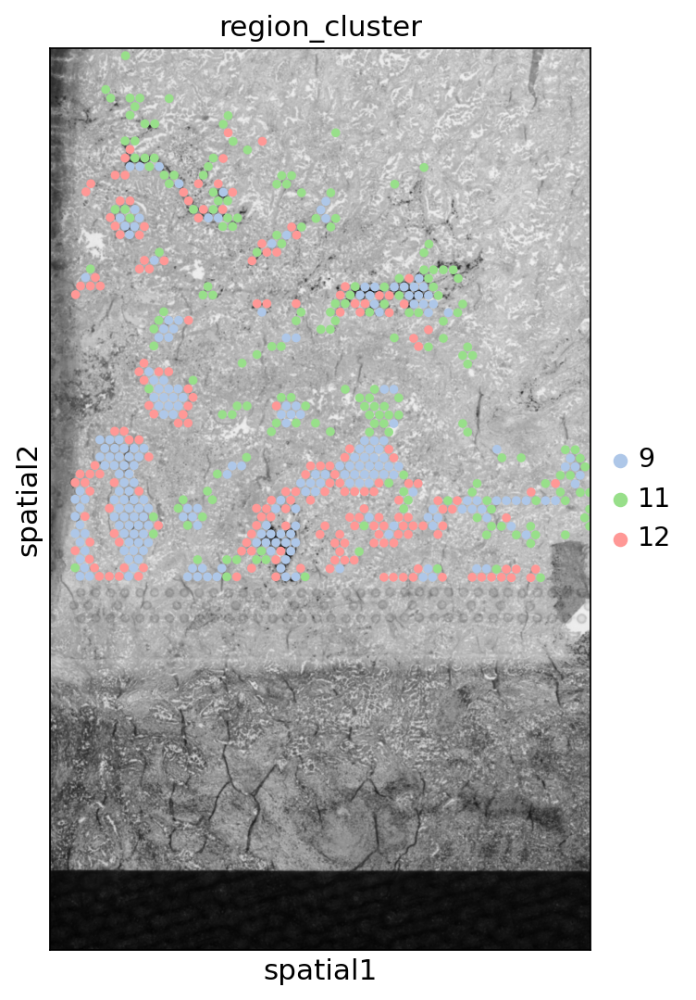

In [35]:
# plot in spatial coordinates
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [8, 8]}):
    sc.pl.spatial(region_cluster_9_11_12, color=['region_cluster'],
                  size=1.3, img_key='hires', alpha=1, bw=True,
                  crop_coord=[300, 1500, 1000, 3000]
                  #crop_coord=[1500, 500, 1500, 500]
                  )

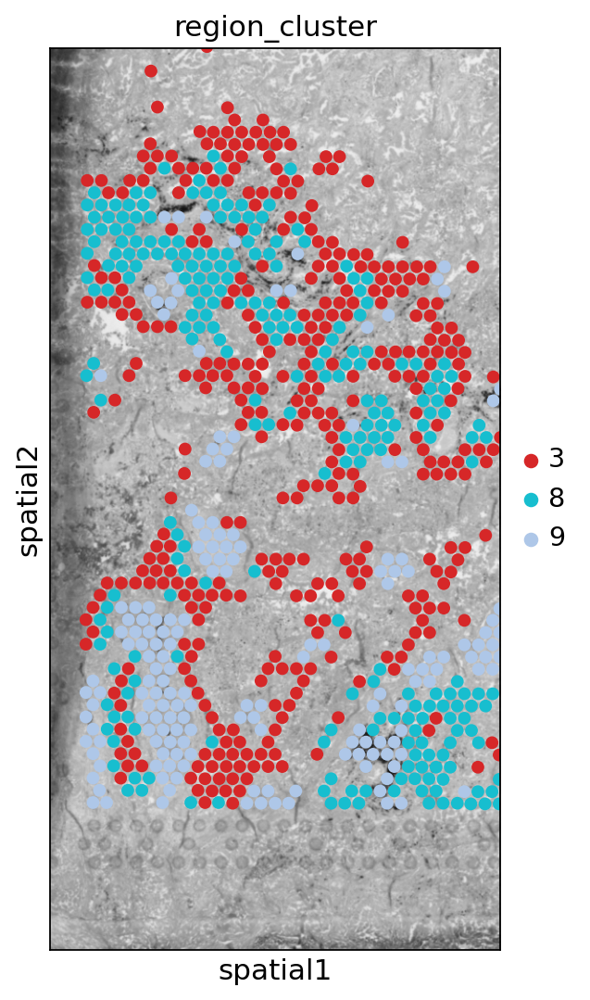

In [35]:
# plot in spatial coordinates
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [8, 8]}):
    sc.pl.spatial(region_cluster_9, color=['region_cluster'],
                  size=1.3, img_key='hires', alpha=1, bw=True,
                  crop_coord=[300, 1000, 1000, 2400]
                  #crop_coord=[1500, 500, 1500, 500]
                  )

## Visualizing marker genes

In [26]:
import scanpy as sc
import pandas as pd
from matplotlib import rcParams

In [10]:
#sc.set_figure_params(dpi=80, color_map='viridis')
#sc.settings.verbosity = 2
#sc.logging.print_versions()

In [31]:
## marker genes
marker_genes = ["THEMIS","CD8A", "SELL", "IL7R"]

In [23]:
adata_st.layers['rawcounts'] = adata_st.X

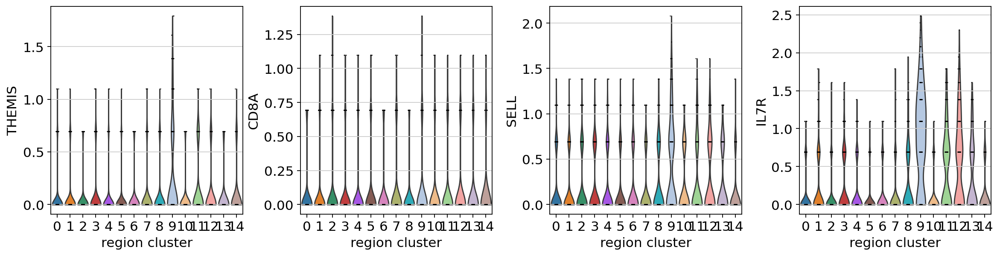

In [32]:
sc.pl.violin(adata_st, marker_genes, 
            groupby='region_cluster',
            layer='logcounts'
)

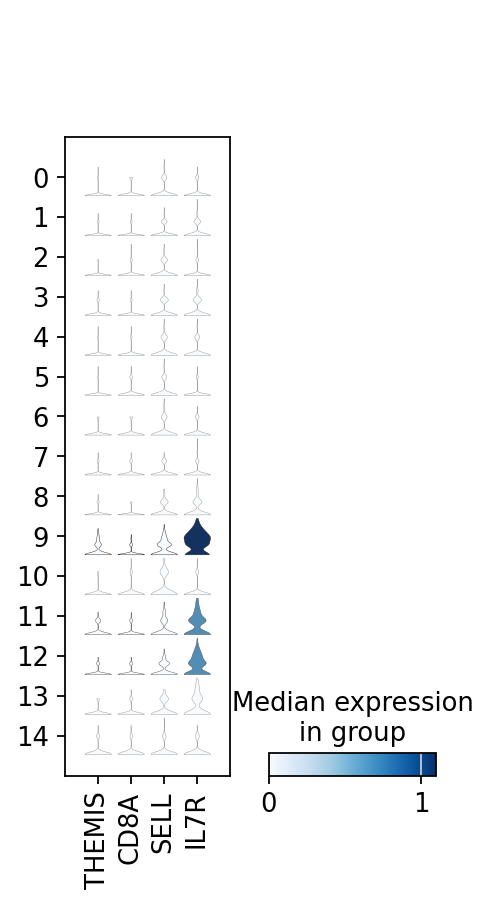

In [37]:
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [10, 10]}):
    ax = sc.pl.stacked_violin(adata_st, marker_genes, 
                              groupby='region_cluster',
                              layer='logcounts'
                              #log=True,
                            #color=['region_cluster']
                            #var_group_positions=9, var_group_labels=['CD8+ Tem']
                            )

#### Cancer markers

In [38]:
## marker genes
cancer_marker_genes = ["KRT7","TTF1", "KRT16", "KRT17", "IL12B", "KRT5", "TP63", "NAPSA"]

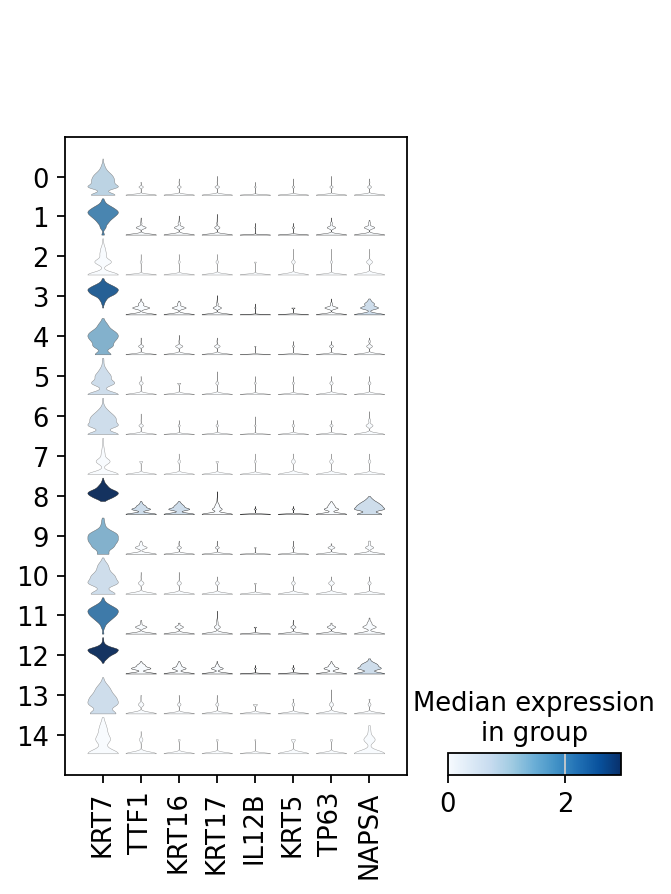

In [41]:
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [10, 10]}):
    ax = sc.pl.stacked_violin(adata_st, cancer_marker_genes, 
                              groupby='region_cluster',
                              layer='logcounts'
                              #log=True,
                            #color=['region_cluster']
                            #var_group_positions=9, var_group_labels=['CD8+ Tem']
                            )

In [43]:
region_cluster_1_3_8_12 = adata_st[(adata_st.obs['region_cluster'] == "1") | 
                            (adata_st.obs['region_cluster'] == "3") |
                            (adata_st.obs['region_cluster'] == "8") |
                            (adata_st.obs['region_cluster'] == "12")
                            ] 

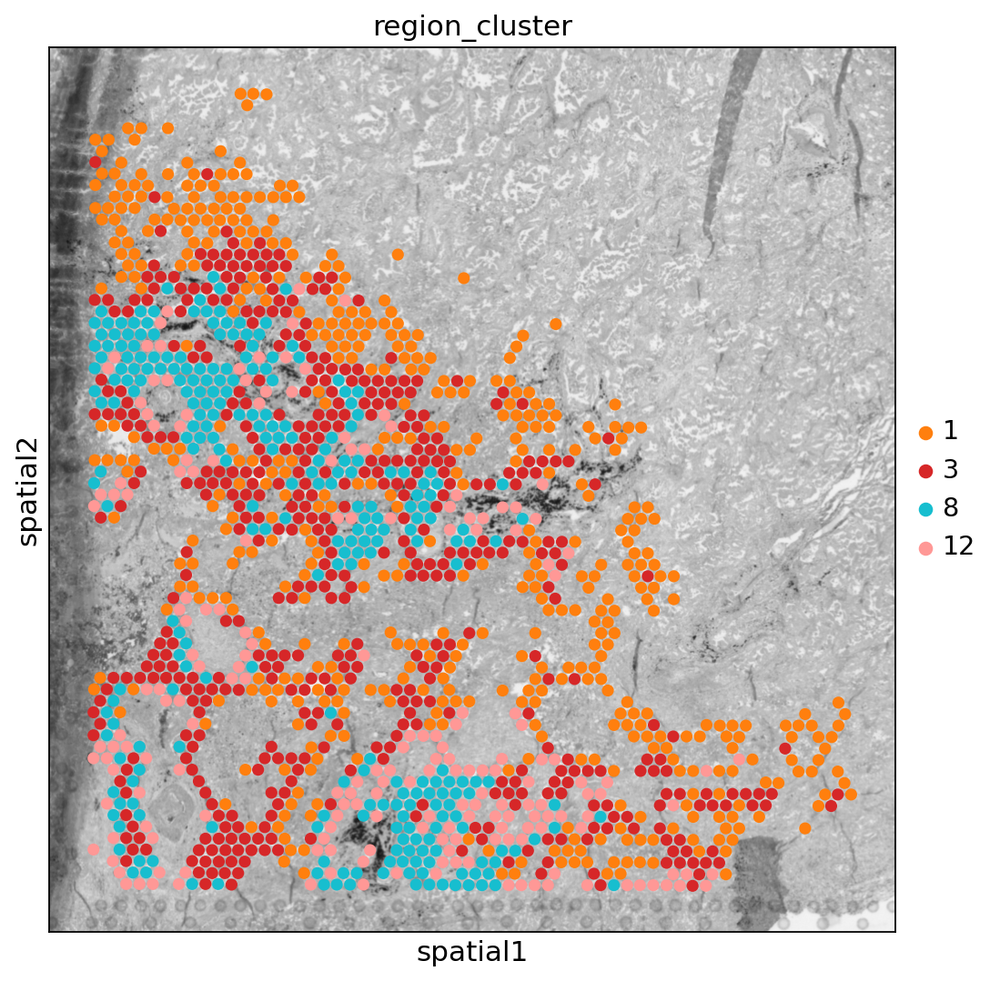

In [44]:
# plot in spatial coordinates
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [8, 8]}):
    sc.pl.spatial(region_cluster_1_3_8_12, color=['region_cluster'],
                  size=1.3, img_key='hires', alpha=1, bw=True,
                  #crop_coord=[300, 1500, 1000, 3000]
                  #crop_coord=[1500, 500, 1500, 500]
                  )

### CICs marker

In [55]:
cic_marker_genes_1 = ["NET1", "ALDH3A1", "PLAT", "GALNT5"] 
cic_marker_genes_2 = ["FAM3C", "DHRS2" , "AQP3", "KRT23" , "SYT8"] # , "HLA-B"

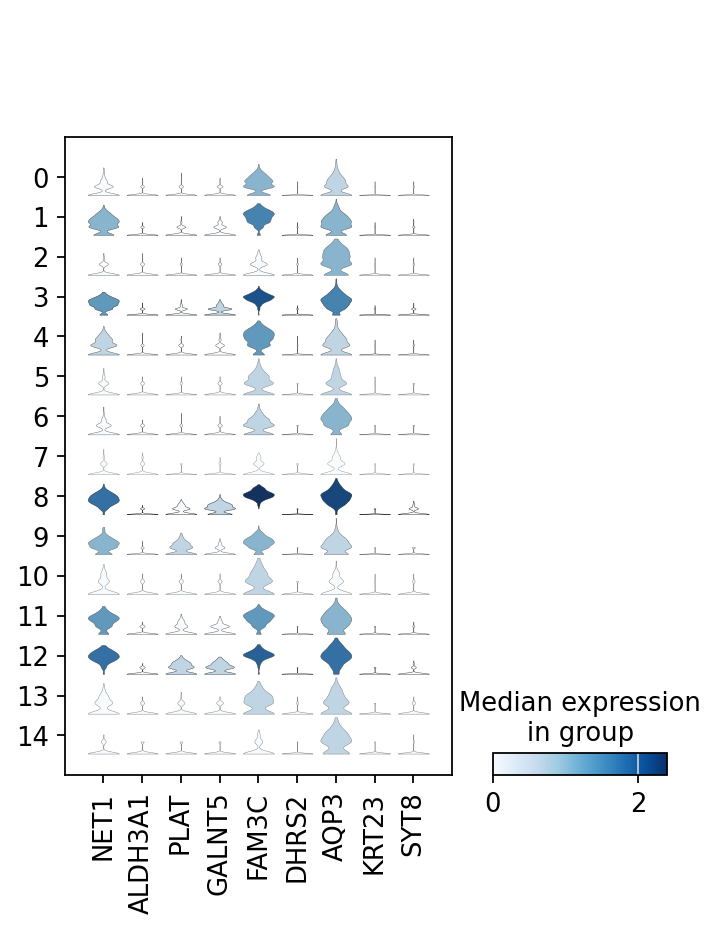

In [52]:
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [10, 10]}):
    ax = sc.pl.stacked_violin(adata_st, cic_marker_genes, 
                              groupby='region_cluster',
                              layer='logcounts'
                              #log=True,
                            #color=['region_cluster']
                            #var_group_positions=9, var_group_labels=['CD8+ Tem']
                            )

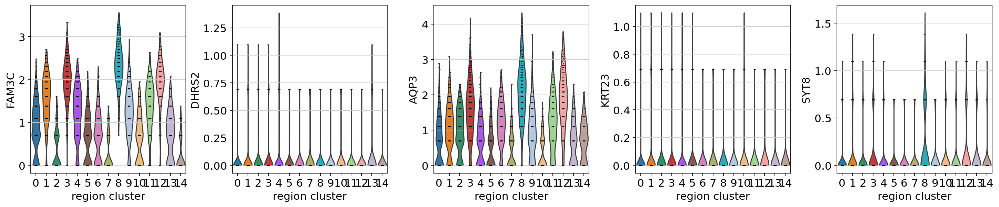

In [57]:
sc.pl.violin(adata_st, cic_marker_genes_2, 
            groupby='region_cluster',
            layer='logcounts'
)

In [58]:
region_cluster_8_9_11_12 = adata_st[(adata_st.obs['region_cluster'] == "8") | 
                            (adata_st.obs['region_cluster'] == "9") |
                            (adata_st.obs['region_cluster'] == "11") |
                            (adata_st.obs['region_cluster'] == "12")
                            ] 

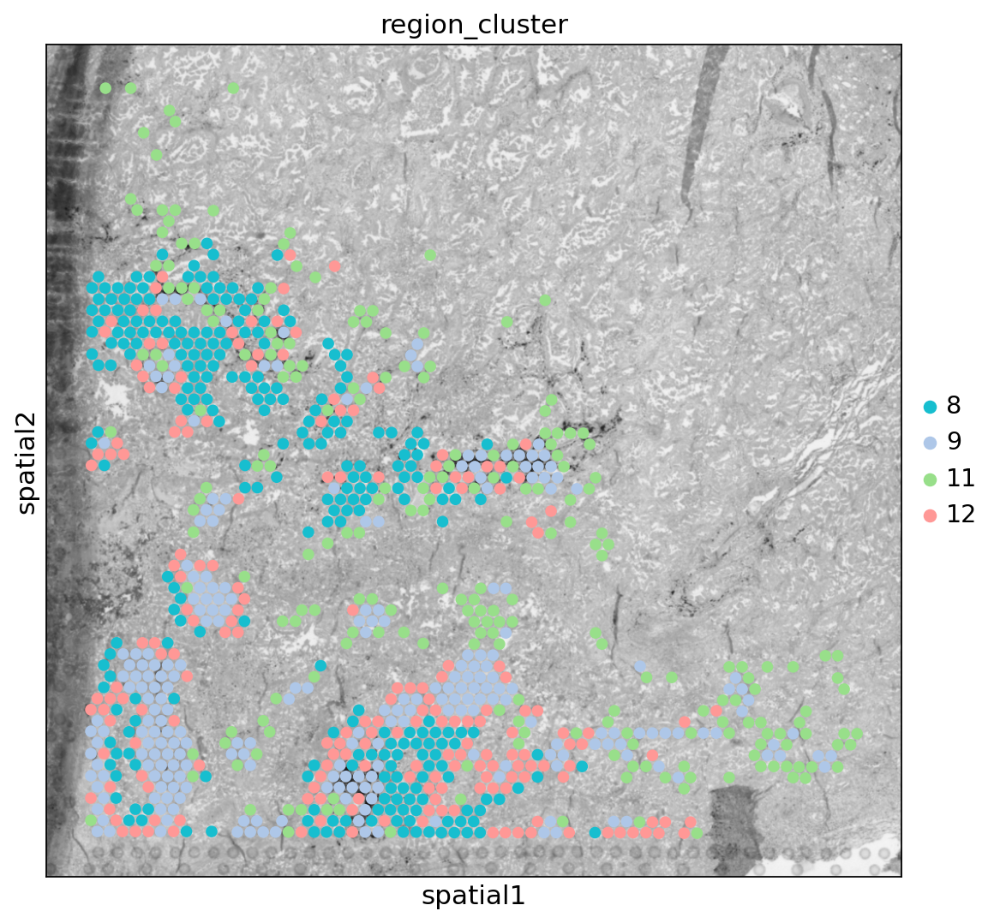

In [59]:
# plot in spatial coordinates
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [8, 8]}):
    sc.pl.spatial(region_cluster_8_9_11_12, color=['region_cluster'],
                  size=1.3, img_key='hires', alpha=1, bw=True,
                  #crop_coord=[300, 1500, 1000, 3000]
                  #crop_coord=[1500, 500, 1500, 500]
                  )

## Colocation

In [11]:
results_folder="/mnt/rdisk/duydao/PROJECT/SPATIAL/cell2loc_data"
run_name = f'{results_folder}/cell2location_map'

In [56]:
from cell2location import run_colocation
res_dict, adata_st = run_colocation(
    adata_st,
    model_name='CoLocatedGroupsSklearnNMF',
    train_args={
      'n_fact': np.arange(5, 30), # IMPORTANT: use a wider range of the number of factors (5-30)
      'sample_name_col': 'sample', # columns in adata_vis.obs that identifies sample
      'n_restarts': 3 # number of training restarts
    },
    # the hyperparameters of NMF can be also adjusted:
    model_kwargs={'alpha': 0.01, 'init': 'random', "nmf_kwd_args": {"tol": 0.000001}},
    export_args={'path': f'{run_name}/CoLocatedComb/'}
)

### Analysis name: CoLocatedGroupsSklearnNMF_5combinations_4961locations_27factors
### Analysis name: CoLocatedGroupsSklearnNMF_6combinations_4961locations_27factors
### Analysis name: CoLocatedGroupsSklearnNMF_7combinations_4961locations_27factors
### Analysis name: CoLocatedGroupsSklearnNMF_8combinations_4961locations_27factors
### Analysis name: CoLocatedGroupsSklearnNMF_9combinations_4961locations_27factors
### Analysis name: CoLocatedGroupsSklearnNMF_10combinations_4961locations_27factors
### Analysis name: CoLocatedGroupsSklearnNMF_11combinations_4961locations_27factors
### Analysis name: CoLocatedGroupsSklearnNMF_12combinations_4961locations_27factors
### Analysis name: CoLocatedGroupsSklearnNMF_13combinations_4961locations_27factors
### Analysis name: CoLocatedGroupsSklearnNMF_14combinations_4961locations_27factors
### Analysis name: CoLocatedGroupsSklearnNMF_15combinations_4961locations_27factors
### Analysis name: CoLocatedGroupsSklearnNMF_16combinations_4961locations_27facto

In [42]:
# Here we plot the NMF weights (Same as saved to `cell_type_fractions_heatmap`)
res_dict['n_fact5']['mod'].plot_cell_type_loadings()

NameError: name 'res_dict' is not defined

### Estimate cell-type specific expression of every gene in the spatial data (needed for NCEM)

#### Load model

In [41]:
mod = c2l.models.RegressionModel.load(f"/mnt/rdisk/duydao/PROJECT/SPATIAL/cell2loc_data", adata_st)

INFO     File /mnt/rdisk/duydao/PROJECT/SPATIAL/cell2loc_data/model.pt already downloaded                          


ValueError: counts is not a valid key in adata.layers.

In [25]:
adata_st

AnnData object with n_obs × n_vars = 4961 × 15619
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', '_indices', '_scvi_batch', '_scvi_labels', 'Alveolar', 'Alveolar Mac', 'CAF', 'CD4+ Treg', 'CD8+ Tem', 'CDKN2A Cancer', 'CXCL1 Cancer', 'Ciliated', 'Endothelial', 'LAMC2 Cancer', 'Lipid-associated Mac', 'Low quality Mac', 'Mast', 'Mature naive B', 'Monocytes', 'NK', 'Naive T', 'Neutrophils', 'Pathological Alveolar', 'Plasma', 'Proliferating Cancer', 'Proliferating Mac', 'Proliferating T/NK', 'SMC', 'SOX2 Cancer', 'cDC2/moDCs', 'pDCs', 'leiden', 'region_cluster', 'sample'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'feature_name', 'MT_gene'
 

In [94]:
import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np


def plot_genes_per_cell_type(slide, genes, ctypes):
    n_genes = len(genes)
    n_ctypes = len(ctypes)
    fig, axs = plt.subplots(
        nrows=n_genes, ncols=n_ctypes + 1, figsize=(4.5 * (n_ctypes + 1) + 2, 5 * n_genes + 1), squeeze=False
    )
    # axs = axs.reshape((n_genes, n_ctypes+1))

    # plots of every gene
    for j in range(n_genes):
        # limit color scale at 99.2% quantile of gene expression (computed across cell types)
        quantile_across_ct = np.array(
            [
                np.quantile(slide.layers[n][:, slide.var["feature_name"] == genes[j]].toarray(), 0.992)
                for n in slide.uns["mod"]["factor_names"]
            ]
        )
        quantile_across_ct = np.partition(quantile_across_ct.flatten(), -2)[-2]
        sc.pl.spatial(
            slide,
            cmap="magma",
            color=genes[j],
            # layer=ctypes[i],
            gene_symbols="feature_name",
            ncols=4,
            size=1.3,
            img_key="hires",
            # limit color scale at 99.2% quantile of gene expression
            vmin=0,
            vmax="p99.2",
            ax=axs[j, 0],
            show=False,
        )

        # plots of every cell type
        for i in range(n_ctypes):
            sc.pl.spatial(
                slide,
                cmap="magma",
                color=genes[j],
                layer=ctypes[i],
                gene_symbols="feature_name",
                ncols=4,
                size=1.3,
                img_key="hires",
                # limit color scale at 99.2% quantile of gene expression
                vmin=0,
                vmax=quantile_across_ct,
                ax=axs[j, i + 1],
                show=False,
            )
            axs[j, i + 1].set_title(f"{genes[j]} {ctypes[i]}")

    return fig, axs

AttributeError: 'dict' object has no attribute 'samples'

In [93]:
# Compute expected expression per cell type
expected_dict = mod.module.model.compute_expected_per_cell_type(
    mod.samples["post_sample_q05"], mod.adata_manager
)

# Add to anndata layers
for i, n in enumerate(mod.factor_names_):
    adata_st.layers[n] = expected_dict['mu'][i]

# Save anndata object with results
adata_file = f"{run_name}/adata_st_est_celltype_specific_expression_A1.h5ad"
adata_st.write(adata_file)
adata_file

AttributeError: 'dict' object has no attribute 'module'

In [ ]:
# list cell types and genes for plotting
ctypes = ["SOX2 Cancer", "CXCL1 Cancer", "CD8+ Tem"]
genes = ['CD3D', 'THEMIS']

with mpl.rc_context({'axes.facecolor':  'black'}):
    # select one slide
    #slide = select_slide(adata_st, 'V1_Human_Lymph_Node')

    #from tutorial_utils import plot_genes_per_cell_type
    plot_genes_per_cell_type(adata_st, genes, ctypes);